In [339]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [340]:
df = pd.read_csv('movies_initial.csv')
df

,imdbID,title,year,rating,runtime,genre,released,director,writer,cast,...,imdbRating,imdbVotes,poster,plot,fullplot,language,country,awards,lastupdated,type
0,1,Carmencita,1894,NOT RATED,1 min,"Documentary, Short",NaN,William K.L. Dickson,NaN,Carmencita,...,5.9,1032.0,https://m.media-amazon.com/images/M/MV5BMjAzND...,Performing on what looks like a small wooden s...,Performing on what looks like a small wooden s...,NaN,USA,NaN,2015-08-26 00:03:45.040000000,movie
1,5,Blacksmith Scene,1893,UNRATED,1 min,Short,1893-05-09,William K.L. Dickson,NaN,"Charles Kayser, John Ott",...,6.2,1189.0,NaN,Three men hammer on an anvil and pass a bottle...,A stationary camera looks at a large anvil wit...,NaN,USA,1 win.,2015-08-26 00:03:50.133000000,movie
2,3,Pauvre Pierrot,1892,NaN,4 min,"Animation, Comedy, Short",1892-10-28,�mile Reynaud,NaN,NaN,...,6.7,566.0,NaN,"One night, Arlequin come to see his lover Colo...","One night, Arlequin come to see his lover Colo...",NaN,France,NaN,2015-08-12 00:06:02.720000000,movie
3,8,Edison Kinetoscopic Record of a Sneeze,1894,NaN,1 min,"Documentary, Short",1894-01-09,William K.L. Dickson,NaN,Fred Ott,...,5.9,988.0,NaN,A man (Thomas Edison's assistant) takes a pinc...,A man (Edison's assistant) takes a pinch of sn...,NaN,USA,NaN,2015-08-10 00:21:07.127000000,movie
4,10,Employees Leaving the Lumi�re Factory,1895,NaN,1 min,"Documentary, Short",1895-03-22,Louis Lumi�re,NaN,NaN,...,6.9,3469.0,NaN,A man opens the big gates to the Lumi�re facto...,A man opens the big gates to the Lumi�re facto...,NaN,France,NaN,2015-08-26 00:03:56.603000000,movie
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46009,5005684,The New Classmate,2015,NaN,NaN,"Drama, Family",2015-10-11,Ashwiny Iyer Tiwari,NaN,"Swara Bhaskar, Ratna Pathak, Pankaj Tripathy",...,NaN,NaN,NaN,NaN,NaN,Hindi,India,NaN,2015-09-10 22:28:58.883000000,movie
46010,5013056,Untitled Christopher Nolan Project,2017,NaN,NaN,Sci-Fi,2017-07-21,Christopher Nolan,"Christopher Nolan (screenplay), Christopher Nolan",NaN,...,NaN,NaN,NaN,Plot is being kept under wraps.,Plot is being kept under wraps.,English,"USA, UK",NaN,2015-09-11 17:15:04.527000000,movie
46011,5013980,Die Turnschuh-Giganten,2016,NaN,NaN,"Biography, Drama, War",NaN,Oliver Dommenget,Christian Schnalke,"Ken Duken, Florian Bartholom�i, Torben Liebrec...",...,NaN,NaN,NaN,NaN,NaN,German,Germany,NaN,2015-09-12 23:13:48.997000000,movie
46012,5016760,The Monster of Mangatiti,2015,NaN,NaN,NaN,2015-09-06,NaN,John Banas,"Greta Gregory, Mark Mitchinson, Flynn Allan, H...",...,NaN,NaN,NaN,Heather Walsh tells her story of the time she ...,Heather Walsh tells her story of the time she ...,English,New Zealand,NaN,2015-09-12 03:47:27.780000000,movie


In [341]:
df.describe()

,imdbID,metacritic,imdbRating,imdbVotes
count,4.601400e+04,9401.000000,44300.000000,4.429900e+04
mean,8.552062e+05,56.896288,6.381454,1.180055e+04
std,1.141979e+06,17.715373,1.183113,4.934499e+04
min,1.000000e+00,1.000000,1.100000,5.000000e+00
25%,8.165750e+04,45.000000,5.800000,3.260000e+02
50%,2.524875e+05,58.000000,6.600000,9.990000e+02
75%,1.370868e+06,70.000000,7.200000,3.829000e+03
max,5.023260e+06,100.000000,9.600000,1.521105e+06


In [342]:
df.dtypes

imdbID           int64
title           object
year            object
rating          object
runtime         object
genre           object
released        object
director        object
writer          object
cast            object
metacritic     float64
imdbRating     float64
imdbVotes      float64
poster          object
plot            object
fullplot        object
language        object
country         object
awards          object
lastupdated     object
type            object
dtype: object

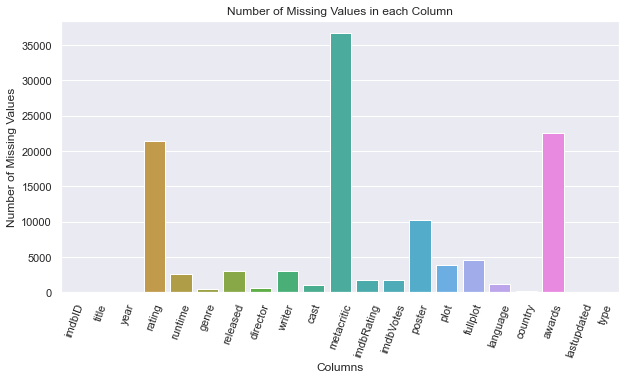

In [343]:
import seaborn as sns
import matplotlib.pyplot as plt
missing_vals = df.isnull().sum()
fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.barplot(x=missing_vals.index, y=missing_vals.values)
plt.xlabel('Columns')
plt.ylabel('Number of Missing Values')
plt.title('Number of Missing Values in each Column')
for item in ax.get_xticklabels():
    item.set_rotation(70)

plt.show()


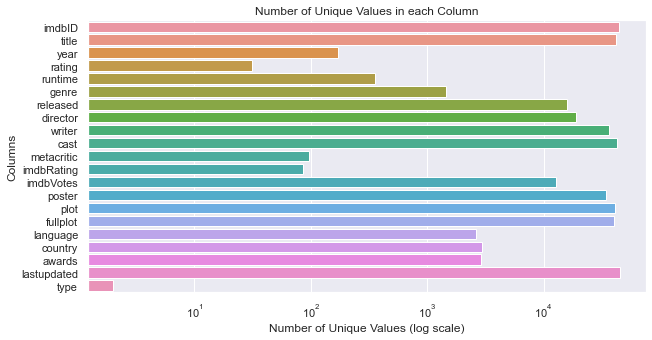

In [344]:
unique_vals = df.nunique()
fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.barplot(x=unique_vals.values, y=unique_vals.index, orient='horizontal')
ax.set_xscale('log')
plt.ylabel('Columns')
plt.xlabel('Number of Unique Values (log scale)')
plt.title('Number of Unique Values in each Column')

plt.show()

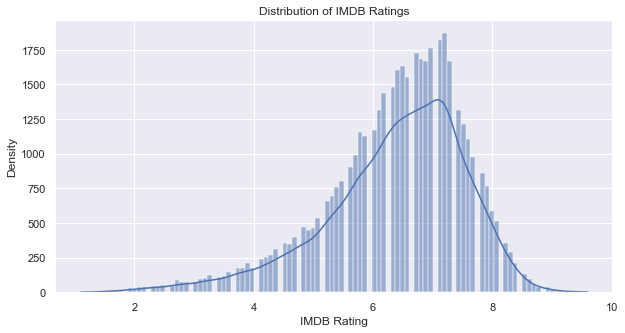

In [345]:
df_filt = df[df['imdbRating'].notnull()]

# Create a figure with a larger width
fig, ax = plt.subplots(figsize=(10, 5))

# Plot the distribution of the 'imdb_rating' column
sns.histplot(data=df_filt, x="imdbRating", kde=True, ax=ax)

# Add labels and title to the plot
plt.xlabel('IMDB Rating')
plt.ylabel('Density')
plt.title('Distribution of IMDB Ratings')
plt.show()

In [346]:
value_counts = df['imdbRating'].value_counts().sort_index()
value_counts

1.1     1
1.2     2
1.3     1
1.4     2
1.5     9
       ..
9.2    11
9.3     4
9.4     5
9.5     4
9.6     1
Name: imdbRating, Length: 86, dtype: int64

In [347]:
genre_value_counts = df['genre'].value_counts()
genre_value_counts = genre_value_counts.sort_values(ascending=False)
genre_value_counts.head(10)

Drama                     5455
Comedy                    3275
Documentary               2047
Comedy, Drama             1643
Drama, Romance            1392
Comedy, Romance           1065
Comedy, Drama, Romance    1053
Horror                     931
Crime, Drama               626
Drama, Thriller            602
Name: genre, dtype: int64

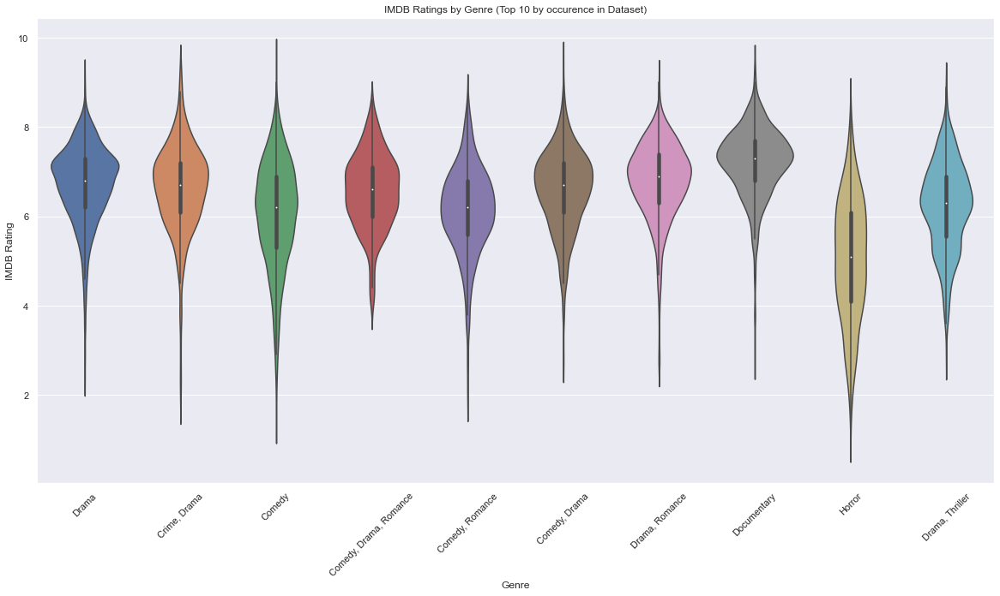

In [348]:
value_counts = df['genre'].value_counts()
top_genres = value_counts.head(10).index.tolist()
df_top_genres = df[df['genre'].isin(top_genres)]
fig, ax = plt.subplots(figsize=(20, 10))
sns.violinplot(x="genre", y="imdbRating", data=df_top_genres, ax=ax, showmedians=True)
plt.xlabel('Genre')
plt.ylabel('IMDB Rating')
plt.title('IMDB Ratings by Genre (Top 10 by occurence in Dataset)')
for item in ax.get_xticklabels():
    item.set_rotation(45)
plt.show()

In [349]:
for index, row in df.iterrows():
    df.at[index, "year"] = df.at[index, "year"][0:4]
df["year"]=df["year"].astype("int")

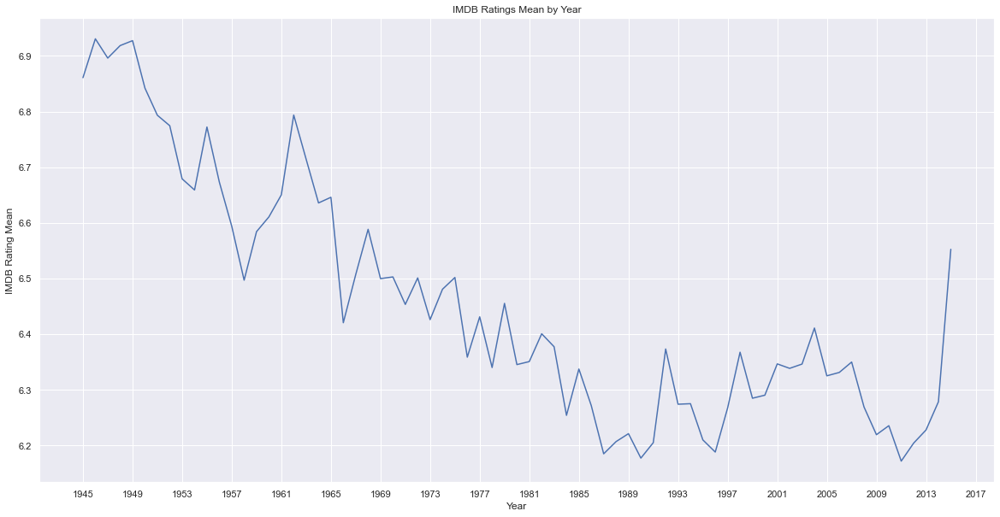

In [350]:
df_mean = df[df['imdbRating'].notna()]
df_mean = df_mean.where(df_mean["year"]>=1945)
df_mean = df_mean.where(df_mean["year"]<=2016)
df_mean = df_mean.groupby('year')['imdbRating'].mean().reset_index()
# Create the line plot
fig, ax = plt.subplots(figsize=(20, 10))
sns.lineplot(x="year", y="imdbRating", data=df_mean, ax=ax)

# Add labels
plt.xlabel('Year')
plt.ylabel('IMDB Rating Mean')
plt.title('IMDB Ratings Mean by Year')
xticks = range(int(df_mean['year'].min()), int(df_mean['year'].max()) + 5, 4)
ax.set_xticks(xticks)
ax.set_xticklabels(xticks)
plt.show()


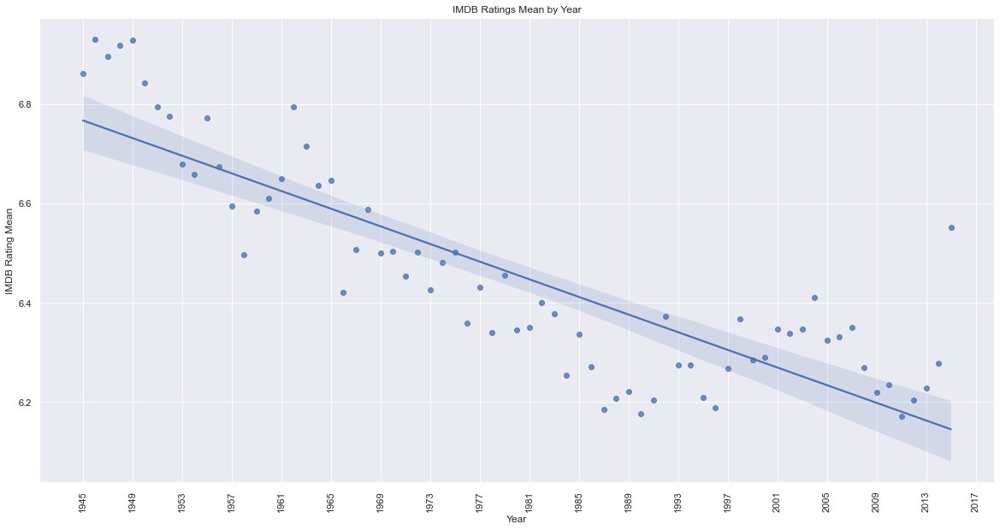

In [351]:
fig, ax = plt.subplots(figsize=(20, 10))
sns.regplot(x="year", y="imdbRating", data=df_mean, ax=ax)
plt.xlabel('Year')
plt.ylabel('IMDB Rating Mean')
plt.title('IMDB Ratings Mean by Year')
xticks = range(int(df_mean['year'].min()), int(df_mean['year'].max()) + 5, 4)
ax.set_xticks(xticks)
ax.set_xticklabels(xticks)
for item in ax.get_xticklabels():
    item.set_rotation(90)
plt.show()

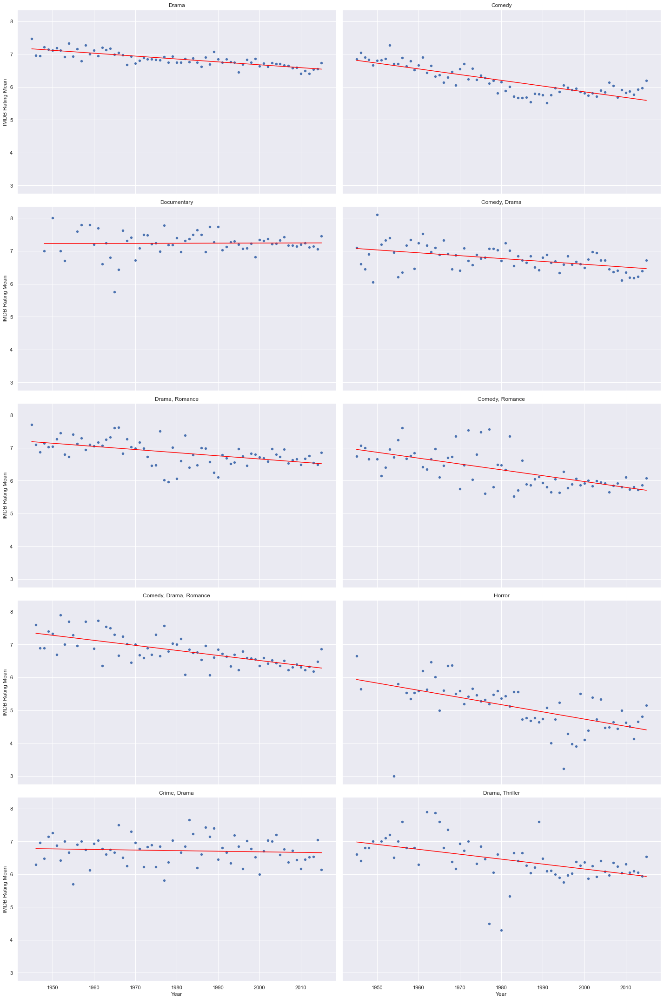

In [352]:
import scipy

genre_counts = df["genre"].value_counts().head(10)
genres = genre_counts.index.tolist()

fig, ax = plt.subplots(5, 2, figsize=(20, 30), sharex=True, sharey=True)
ax = ax.flatten()
for i, genre in enumerate(genres):
    df_genre = df[df["genre"] == genre]
    df_mean = df_genre[df_genre['imdbRating'].notna()]
    df_mean = df_mean.where(df_mean["year"]>=1945)
    df_mean = df_mean.where(df_mean["year"]<=2016)
    df_mean = df_mean.groupby('year')['imdbRating'].mean().reset_index()
    sns.scatterplot(x="year", y="imdbRating", data=df_mean, ax=ax[i])
    slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(df_mean["year"], df_mean["imdbRating"])
    x = df_mean["year"]
    y = slope * x + intercept
    ax[i].plot(x, y, color="red")

    ax[i].set_title(genre)
    if i == 8 or i == 9:
        ax[i].set_xlabel("Year")
    if i == 0 or i == 2 or i == 4 or i == 6 or i == 8:
        ax[i].set_ylabel("IMDB Rating Mean")

plt.tight_layout()
plt.show()

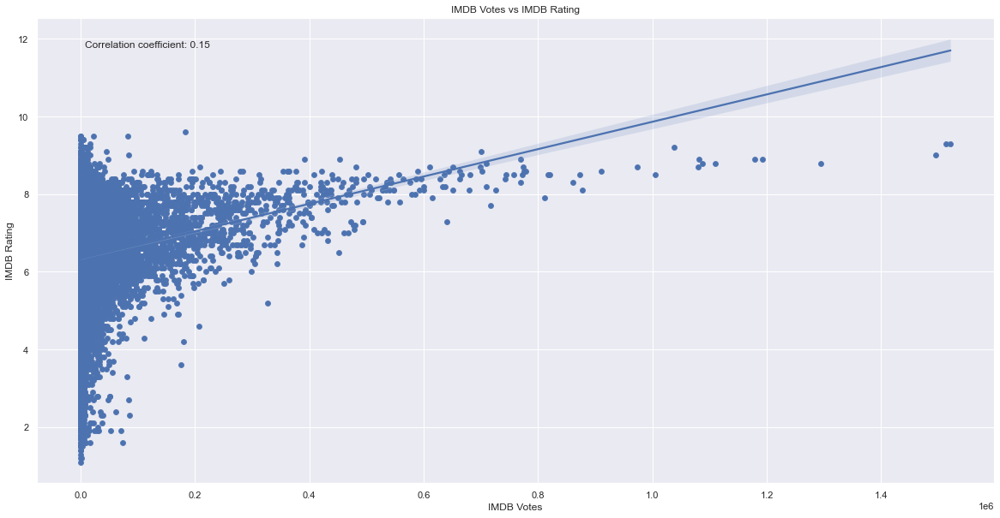

In [353]:
fig, ax = plt.subplots(figsize=(20, 10))
sns.scatterplot(x="imdbVotes", y="imdbRating", data=df, ax=ax)
correlation_coefficient = df['imdbVotes'].corr(df['imdbRating'])
sns.regplot(x="imdbVotes", y="imdbRating", data=df, ax=ax)
text = "Correlation coefficient: {:.2f}".format(correlation_coefficient)
ax.text(0.05, 0.95, text, transform=ax.transAxes, verticalalignment='top')
plt.xlabel('IMDB Votes')
plt.ylabel('IMDB Rating')
plt.title('IMDB Votes vs IMDB Rating')
plt.show()

In [354]:
import plotly.express as px

fig = px.scatter(x=df["imdbVotes"],
                 y=df["imdbRating"],
                 hover_data=[df["title"], df["imdbRating"],df["year"]],
                 )

fig.update_layout(
    title="IMDB Votes vs IMDB Rating",
    xaxis_title="IMDB Votes",
    yaxis_title="IMDB Rating",
    font=dict(size=10),
    width=1000,
    height=800
)

fig.show()

In [355]:
df = df.dropna(subset=['country'])
df['country'] = df['country'].str.lower().str.strip().str.split(',')
df['country'] = df['country'].apply(lambda x: sorted(x))
df['country'] = df['country'].apply(lambda x: ','.join(x))

C:\Users\timos\AppData\Local\Temp\ipykernel_15072\1632660609.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\timos\AppData\Local\Temp\ipykernel_15072\1632660609.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\timos\AppData\Local\Temp\ipykernel_15072\1632660609.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

In [356]:
df["country"]

0                usa
1                usa
2             france
3                usa
4             france
            ...     
46009          india
46010         uk,usa
46011        germany
46012    new zealand
46013            usa
Name: country, Length: 45830, dtype: object

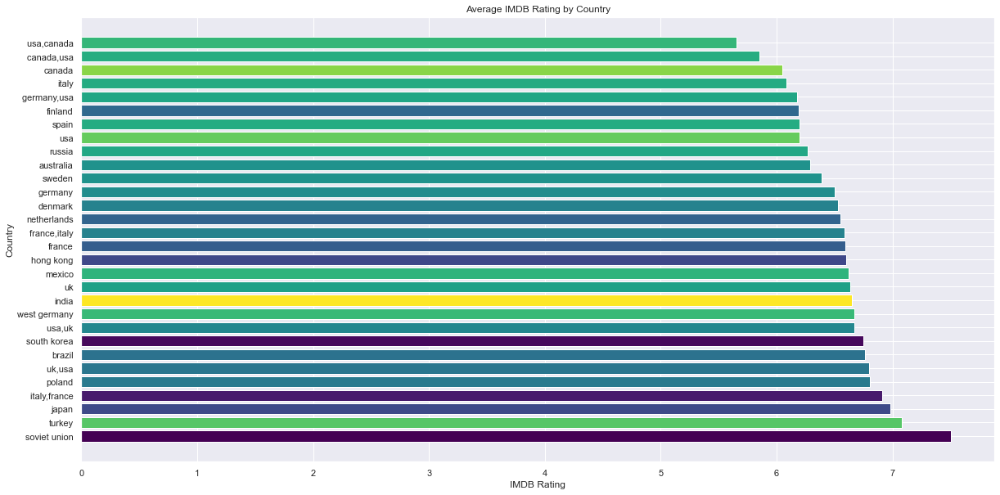

In [357]:
import matplotlib.cm as cm
df_country = df['country'].value_counts().head(30)
top_countries = df_country.index.tolist()
df_top_countries = df[df['country'].isin(top_countries)]
avg_rating = df_top_countries.groupby('country')['imdbRating'].mean().reset_index()
std_dev = df_top_countries.groupby('country')['imdbRating'].std().reset_index()
avg_std = avg_rating.merge(std_dev, on='country')
avg_std = avg_std.sort_values(by='imdbRating_x', ascending=False)
plt.figure(figsize=(20, 10))
cmap = cm.get_cmap('viridis')
normalize = plt.Normalize(vmin=min(avg_std['imdbRating_y']), vmax=max(avg_std['imdbRating_y']))
colors = cmap(normalize(avg_std['imdbRating_y']))
plt.barh(avg_std['country'], avg_std['imdbRating_x'], color=colors)
plt.xlabel('IMDB Rating')
plt.ylabel('Country')
plt.title('Average IMDB Rating by Country')
plt.show()

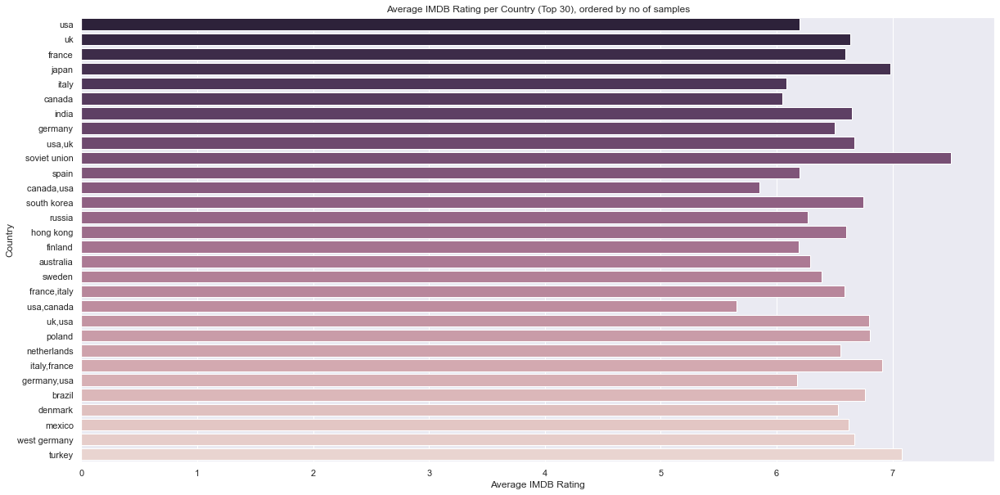

In [358]:
df_country = df['country'].value_counts().head(30)
occurece_df = df_country
top_countries = df_country.index.tolist()
df_top_countries = df[df['country'].isin(top_countries)]
df_country = df_top_countries.groupby('country')['imdbRating'].mean().reset_index()
df_country = df_country.join(occurece_df, on=df_country["country"] , how='left', lsuffix='_left', rsuffix='_right')
df_country.sort_values(by="country_right",inplace=True,ascending=False)
plt.figure(figsize=(20, 10))

sns.barplot(x="imdbRating", y="country_left", data=df_country,palette=reversed(sns.cubehelix_palette(n_colors=len(df_country))))
plt.xlabel("Average IMDB Rating")
plt.ylabel("Country")
plt.title("Average IMDB Rating per Country (Top 30), ordered by no of samples")
plt.show()

In [359]:
df["awards"].value_counts()

1 nomination.                                                       3155
1 win.                                                              2214
1 win & 1 nomination.                                               1240
2 nominations.                                                      1115
2 wins.                                                              726
                                                                    ... 
Won 5 Oscars. Another 18 wins & 12 nominations.                        1
Nominated for 7 Oscars. Another 1 win.                                 1
Nominated for 1 Golden Globe. Another 7 wins & 1 nomination.           1
Won 4 Oscars. Another 33 wins & 40 nominations.                        1
Nominated for 3 Golden Globes. Another 12 wins & 14 nominations.       1
Name: awards, Length: 2901, dtype: int64

In [360]:
import re

def extract_noms_and_wins(string):
    if not isinstance(string, str):
        return 0
    integers = re.findall(r'\d+', string)
    integers = [int(i) for i in integers]
    return sum(integers)

df['nomsandwins']= df['awards'].apply(extract_noms_and_wins)

C:\Users\timos\AppData\Local\Temp\ipykernel_15072\2946958012.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Text(0.5, 0.93, 'Top Movies by number of Won and Nominated Prices:')

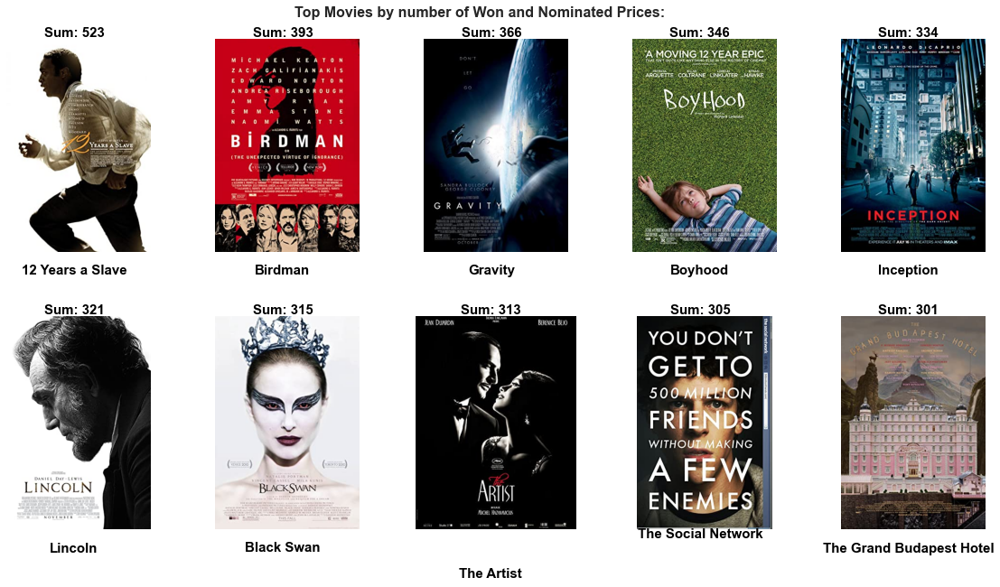

In [361]:
import urllib
df_removed = df.dropna(subset=['poster'])
# Get the top 10 films based on the nomsandwins column
top_10 = df_removed.nlargest(11, 'nomsandwins')
top_10.drop_duplicates(inplace=True, subset=["title"])
# Create a list of the URLs for the top 10 films
poster_urls = top_10['poster'].tolist()

# Download the images and store them as arrays
images = []
for url in poster_urls:
    with urllib.request.urlopen(url) as url:
        image = plt.imread(url, format='jpeg')
        images.append(image)

fig, ax = plt.subplots(2, 5, figsize=(20, 10))
for i, image in enumerate(images):
    ax[i//5, i%5].imshow(image)
    ax[i//5, i%5].axis('off')
   
    ax[i//5, i%5].text(140, -5, "Sum: "+ str(top_10.iloc[i]['nomsandwins']), 
                      ha='center', fontsize=15, color='black', fontweight='bold')
    ax[i//5, i%5].text(140, 490, top_10.iloc[i]['title'].split(":")[0].strip(), 
                      ha='center', fontsize=15, color='black', fontweight='bold')
plt.subplots_adjust(hspace=0.3)
plt.suptitle("Top Movies by number of Won and Nominated Prices:", fontweight='bold', fontsize=16, y=0.93)

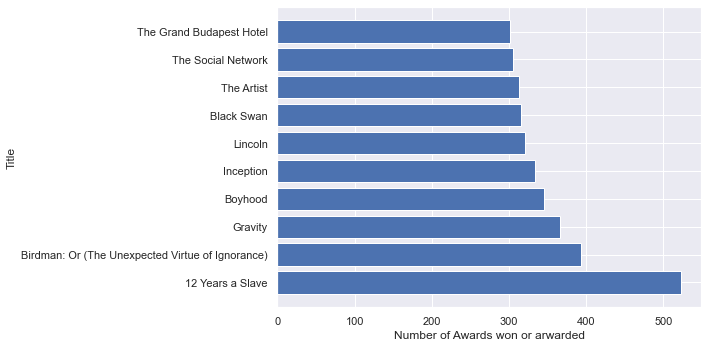

In [362]:
# Create a barplot of the nomsandwins column
fig, ax = plt.subplots(figsize=(10, 5))
ax.barh(y=top_10['title'], width=top_10['nomsandwins'])
ax.set_ylabel("Title")
ax.set_xlabel("Number of Awards won or arwarded")
plt.tight_layout()
plt.show()

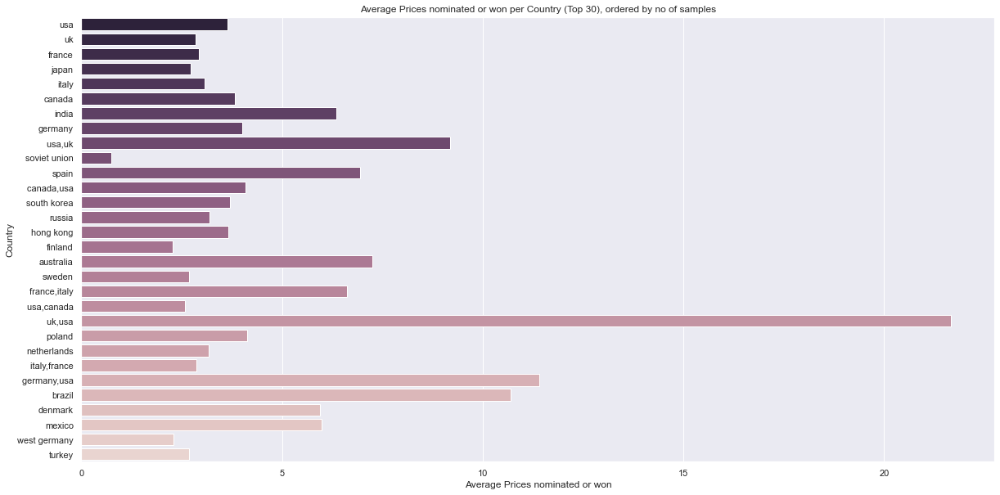

In [363]:
df_country = df['country'].value_counts().head(30)
occurece_df = df_country
top_countries = df_country.index.tolist()
df_top_countries = df[df['country'].isin(top_countries)]
df_country = df_top_countries.groupby('country')['nomsandwins'].mean().reset_index()
df_country = df_country.join(occurece_df, on=df_country["country"] , how='left', lsuffix='_left', rsuffix='_right')
df_country.sort_values(by="country_right",inplace=True,ascending=False)
plt.figure(figsize=(20, 10))
sns.barplot(x="nomsandwins", y="country_left", data=df_country,palette=reversed(sns.cubehelix_palette(n_colors=len(df_country))))
plt.xlabel("Average Prices nominated or won")
plt.ylabel("Country")
plt.title("Average Prices nominated or won per Country (Top 30), ordered by no of samples")
plt.show()

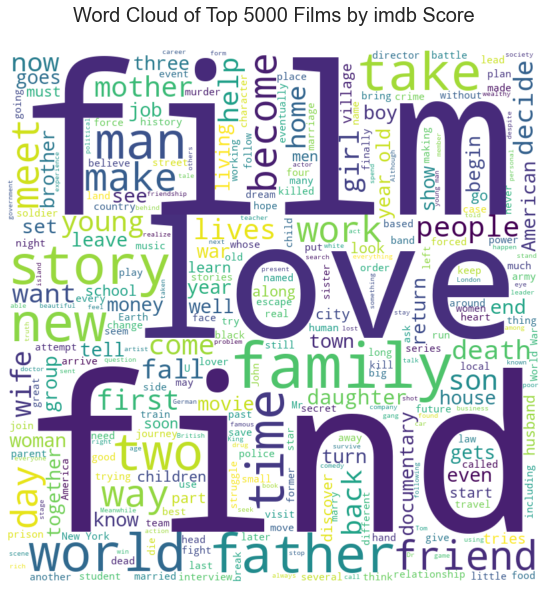

In [422]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS

STOPWORDS.add("one")
STOPWORDS.add("life")
STOPWORDS.add("live")
STOPWORDS.add("will")
df_top_500 = df.nlargest(5000, 'imdbRating')
df_top_500 = df_top_500.dropna(subset=['fullplot'])
text = ' '.join(df_top_500['fullplot'].tolist())
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color='white',
                      width=800, height=800, max_words=300,
                      min_font_size=10).generate(text)

plt.figure(figsize=(8, 8), facecolor=None)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud of Top 5000 Films by imdb Score\n", fontsize=20)
plt.tight_layout(pad=0)
plt.show()

C:\Users\timos\AppData\Local\Temp\ipykernel_15072\1054411225.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



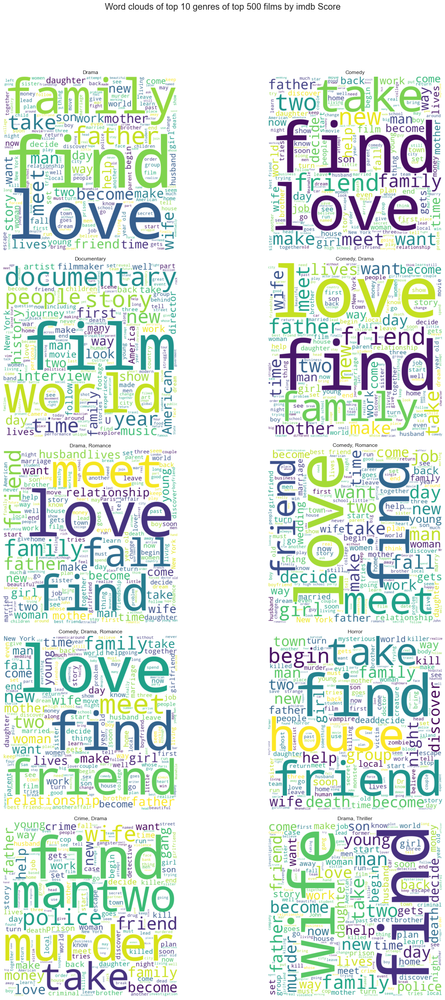

In [395]:
from collections import Counter
df_filtered = df.dropna(subset=['fullplot', 'genre',"imdbRating"])
df_filtered['genre'] = df_filtered['genre'].str.strip()
df_filtered = df_filtered[['fullplot', 'genre',"imdbRating"]].sort_values('imdbRating', ascending=False)
value_counts = df['genre'].value_counts()
top_genres = value_counts.head(10).index.tolist()
fig, ax = plt.subplots(5, 2, figsize=(20, 30))
ax = ax.ravel()
for i, genre in enumerate(top_genres):
    # Get the texts for the current genre
    genre_text = df_filtered[df_filtered['genre'].str.contains(genre)]['fullplot'].str.cat(sep=' ')

    # Create a word cloud for the current genre
    wordcloud = WordCloud(width=800, height=800, background_color='white').generate(genre_text)

    # Display the word cloud
    ax[i].imshow(wordcloud, interpolation='bilinear')
    ax[i].axis('off')
    ax[i].set_title(genre)

plt.suptitle("Word clouds of top 10 genres of top 500 films by imdb Score", fontsize=20, y=1.05)
plt.tight_layout()
plt.show()

In [399]:
import nltk
from nltk import word_tokenize
from nltk.tag import pos_tag

nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

def get_nouns(text):
    words = word_tokenize(text)
    tagged_words = pos_tag(words)
    nouns = [word for word, pos in tagged_words if pos in ['NN', 'NNS', 'NNP', 'NNPS']]
    return nouns
df_nouns = df 
df_nouns = df_nouns.dropna(subset=['fullplot'])
df_nouns['fullplot_nouns'] = df_nouns['fullplot'].apply(get_nouns)

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\timos\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\timos\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
C:\Users\timos\AppData\Local\Temp\ipykernel_15072\3264165375.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



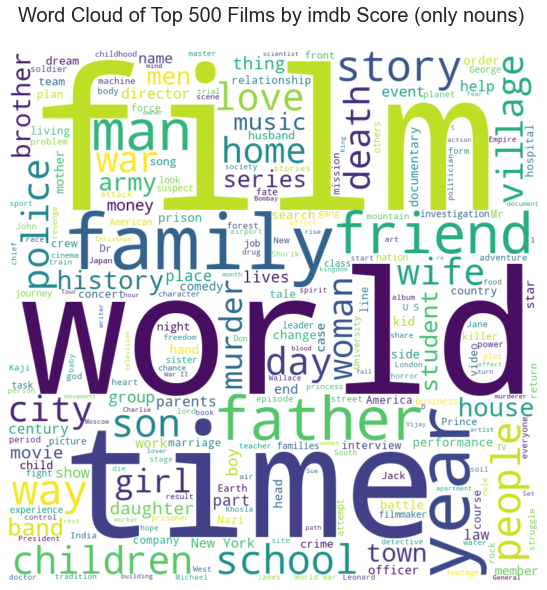

In [424]:
df_nouns = df_nouns.nlargest(500, 'imdbRating')
text = ""
for ele in df_nouns["fullplot_nouns"]:
     text = text + " ".join(ele)
wordcloud = WordCloud(stopwords=stopwords, background_color='white',
                      width=800, height=800, max_words=300,
                      min_font_size=10).generate(text)

plt.figure(figsize=(8, 8), facecolor=None)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud of Top 500 Films by imdb Score (only nouns) \n", fontsize=20)
plt.tight_layout(pad=0)
plt.show()

In [412]:
text

[['stage',
  'dress',
  'hoop',
  'skirt',
  'pumps',
  'Carmencita',
  'dance',
  'kicks',
  'twirls',
  'smile',
  'face'],
 ['camera',
  'anvil',
  'blacksmith',
  'side',
  'smith',
  'metal',
  'rod',
  'fire',
  'anvil',
  'hammering',
  'blows',
  'metal',
  'fire',
  'smith',
  'bottle',
  'beer',
  'swig',
  'metal',
  'hammering',
  'resumes'],
 ['night',
  'Arlequin',
  'lover',
  'Colombine',
  'Pierrot',
  'knocks',
  'door',
  'Colombine',
  'Arlequin',
  'hide',
  'Pierrot',
  'Arlequin',
  'man'],
 ['man',
  'Edison',
  'assistant',
  'pinch',
  'snuff',
  'sneezes',
  'Edison',
  'films',
  'motion',
  'picture',
  'United',
  'States'],
 ['man',
  'gates',
  'Lumi�re',
  'factory',
  'gateway',
  'doorway',
  'workers',
  'women',
  'dresses',
  'hats',
  'men',
  'man',
  'apron',
  'rushes',
  'crowd',
  'dog',
  'men',
  'bikes',
  'gateway',
  'workers',
  'factory',
  'doorkeeper',
  'gates'],
 ['group',
  'people',
  'line',
  'platform',
  'railway',
  'station

In [404]:
df_nouns

,imdbID,title,year,rating,runtime,genre,released,director,writer,cast,...,poster,plot,fullplot,language,country,awards,lastupdated,type,nomsandwins,fullplot_nouns
0,1,Carmencita,1894,NOT RATED,1 min,"Documentary, Short",NaN,William K.L. Dickson,NaN,Carmencita,...,https://m.media-amazon.com/images/M/MV5BMjAzND...,Performing on what looks like a small wooden s...,Performing on what looks like a small wooden s...,NaN,usa,NaN,2015-08-26 00:03:45.040000000,movie,0,"[stage, dress, hoop, skirt, pumps, Carmencita,..."
1,5,Blacksmith Scene,1893,UNRATED,1 min,Short,1893-05-09,William K.L. Dickson,NaN,"Charles Kayser, John Ott",...,NaN,Three men hammer on an anvil and pass a bottle...,A stationary camera looks at a large anvil wit...,NaN,usa,1 win.,2015-08-26 00:03:50.133000000,movie,1,"[camera, anvil, blacksmith, side, smith, metal..."
2,3,Pauvre Pierrot,1892,NaN,4 min,"Animation, Comedy, Short",1892-10-28,�mile Reynaud,NaN,NaN,...,NaN,"One night, Arlequin come to see his lover Colo...","One night, Arlequin come to see his lover Colo...",NaN,france,NaN,2015-08-12 00:06:02.720000000,movie,0,"[night, Arlequin, lover, Colombine, Pierrot, k..."
3,8,Edison Kinetoscopic Record of a Sneeze,1894,NaN,1 min,"Documentary, Short",1894-01-09,William K.L. Dickson,NaN,Fred Ott,...,NaN,A man (Thomas Edison's assistant) takes a pinc...,A man (Edison's assistant) takes a pinch of sn...,NaN,usa,NaN,2015-08-10 00:21:07.127000000,movie,0,"[man, Edison, assistant, pinch, snuff, sneezes..."
4,10,Employees Leaving the Lumi�re Factory,1895,NaN,1 min,"Documentary, Short",1895-03-22,Louis Lumi�re,NaN,NaN,...,NaN,A man opens the big gates to the Lumi�re facto...,A man opens the big gates to the Lumi�re facto...,NaN,france,NaN,2015-08-26 00:03:56.603000000,movie,0,"[man, gates, Lumi�re, factory, gateway, doorwa..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46006,4995590,Junjun,2015,NaN,54 min,Documentary,2015-10-08,Paul Thomas Anderson,NaN,Jonny Greenwood,...,NaN,"Musician Jonny Greenwood travels to Rajasthan,...","Musician Jonny Greenwood travels to Rajasthan,...",English,usa,NaN,2015-09-04 23:55:00.940000000,movie,0,"[Jonny, Greenwood, travels, Rajasthan, multitu..."
46007,5001436,The Curse of Robert the Doll,2016,NaN,NaN,Horror,NaN,Andrew Jones,Andrew Jones,NaN,...,NaN,A cash strapped student who starts working the...,A cash strapped student who starts working the...,NaN,uk,NaN,2015-09-11 00:09:55.600000000,movie,0,"[cash, student, night, shift, Museum, exhibits..."
46008,4195278,Bana Masal Anlatma,2015,NaN,103 min,"Comedy, Fantasy, Romance",2015-01-09,Burak Aksak,"Burak Aksak, Burak Aksak","Hande Dogandemir, Fatih Artman, Cengiz Bozkurt...",...,https://m.media-amazon.com/images/M/MV5BMjA5OD...,The story of a minibus driver and a fairytale ...,Riza is a minibus driver universally loved by ...,"Turkish, English",turkey,NaN,2015-09-10 18:11:49.727000000,movie,0,"[Riza, minibus, driver, folk, Surici, neighbor..."
46010,5013056,Untitled Christopher Nolan Project,2017,NaN,NaN,Sci-Fi,2017-07-21,Christopher Nolan,"Christopher Nolan (screenplay), Christopher Nolan",NaN,...,NaN,Plot is being kept under wraps.,Plot is being kept under wraps.,English,"uk,usa",NaN,2015-09-11 17:15:04.527000000,movie,0,"[Plot, wraps]"
